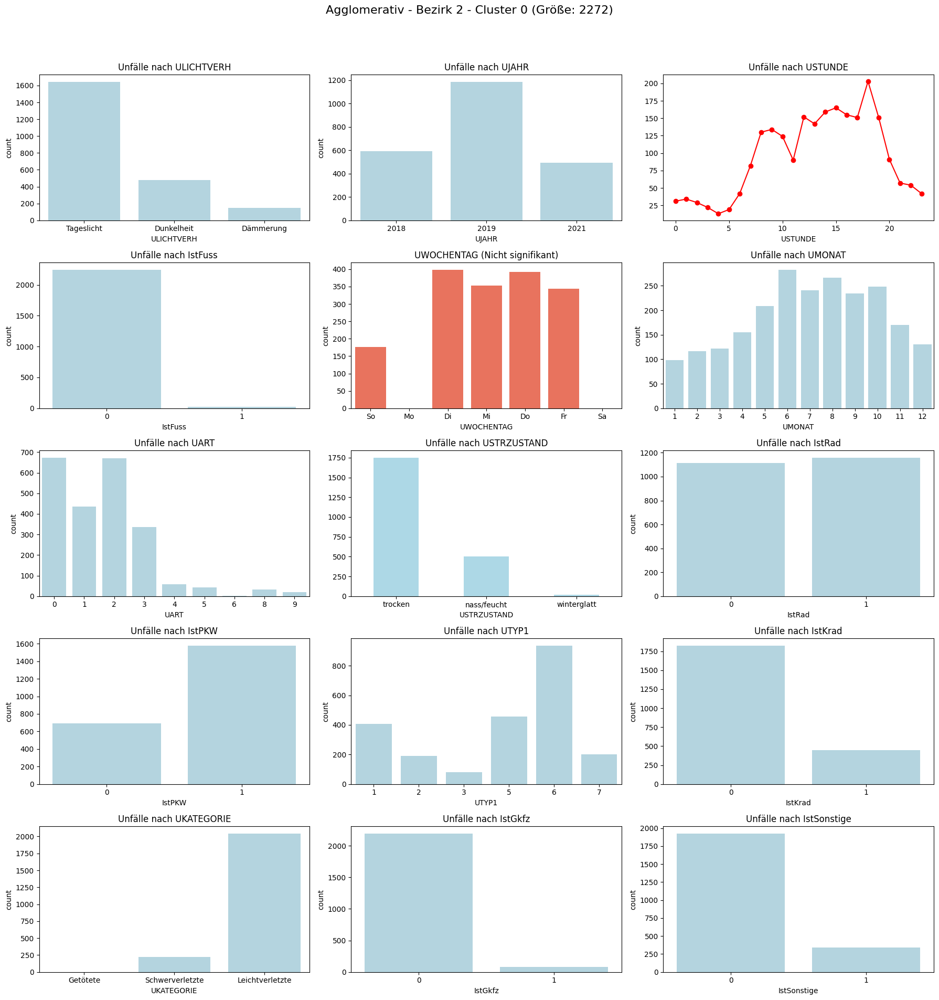

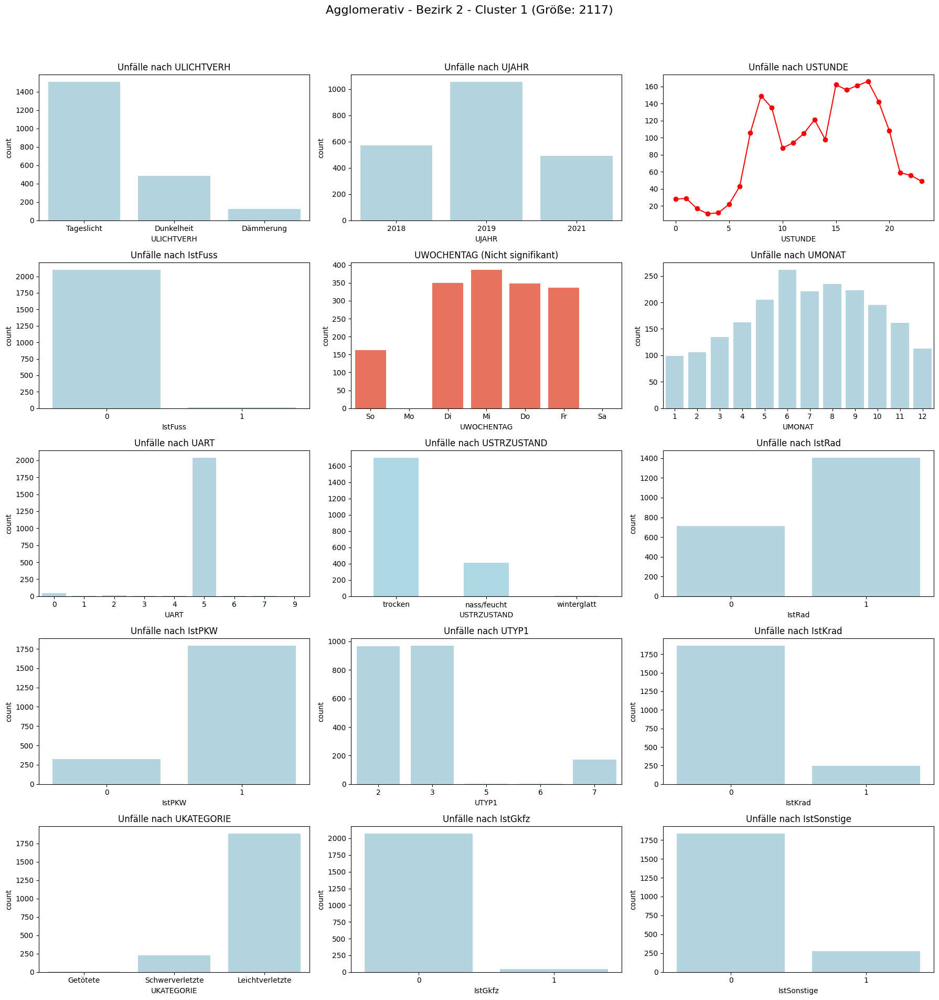

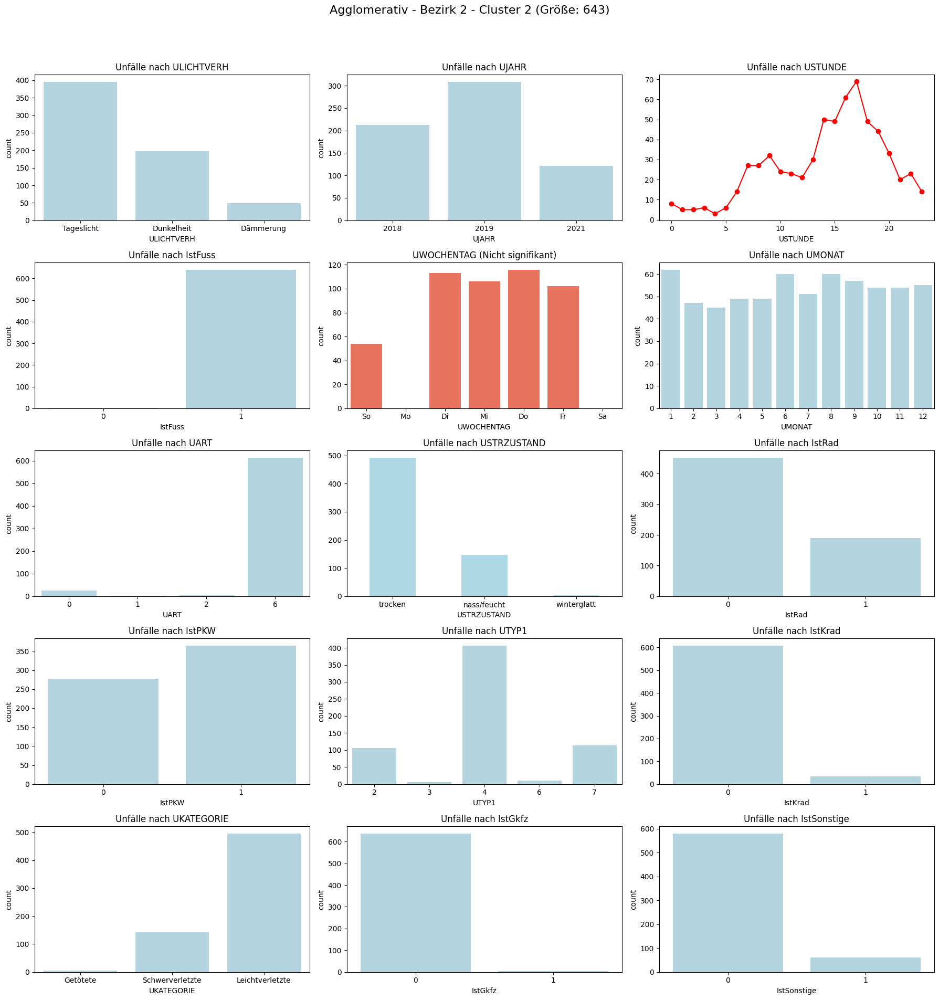

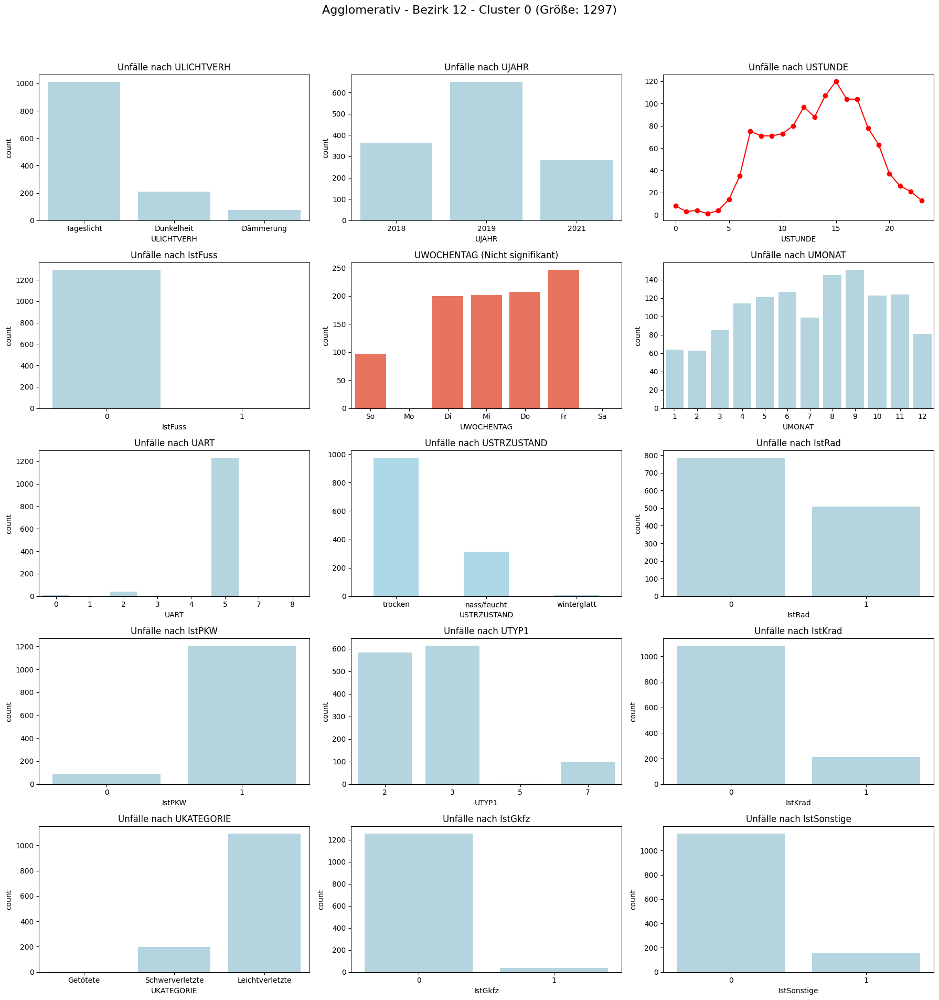

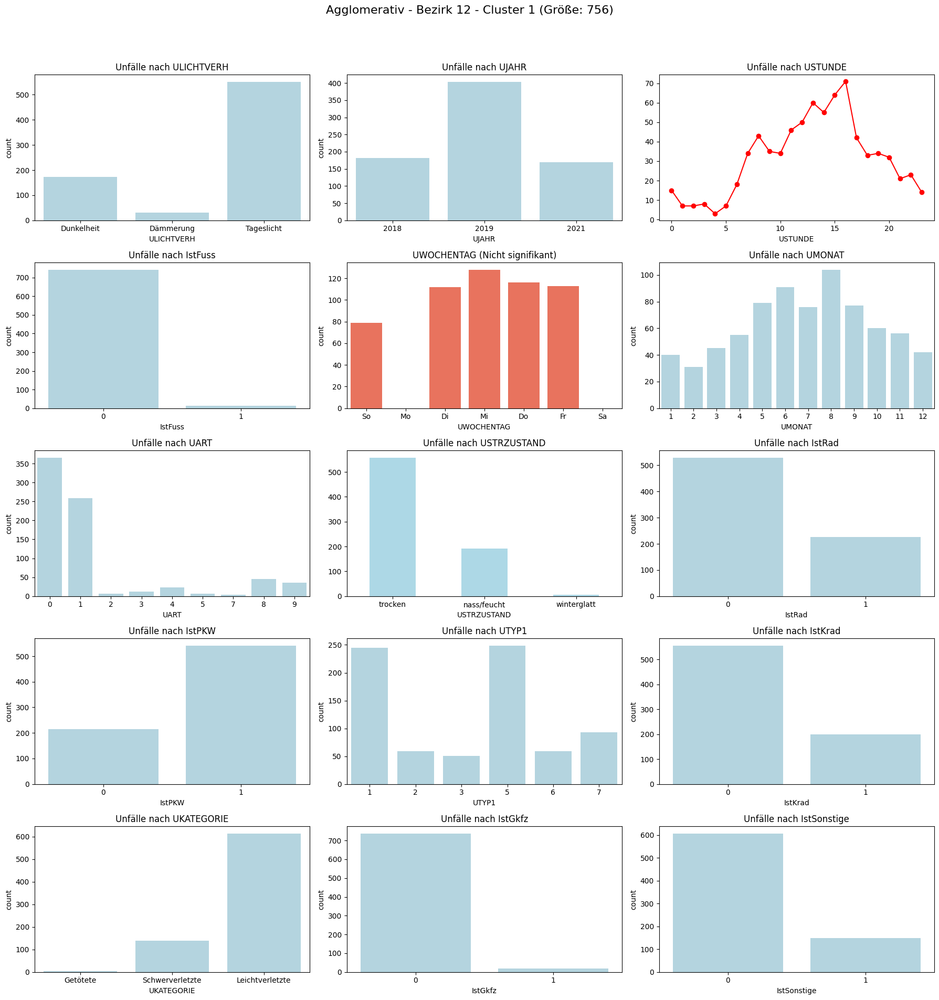

...

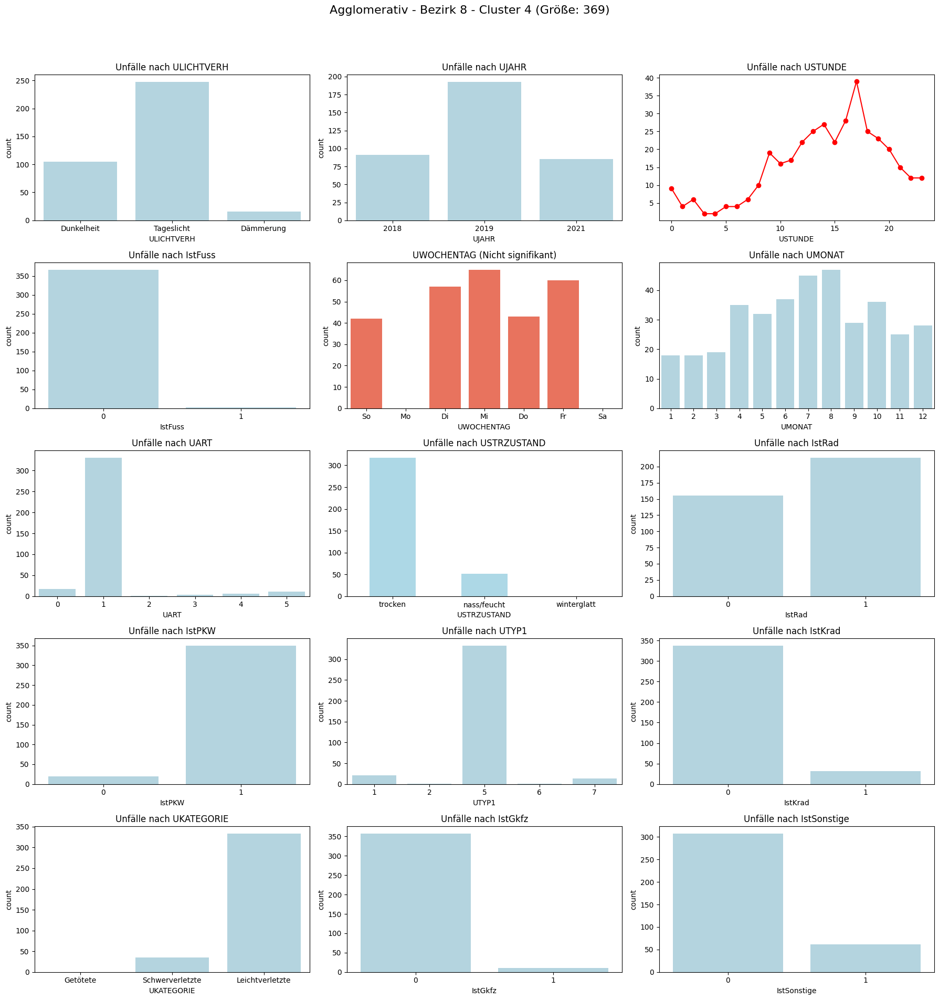

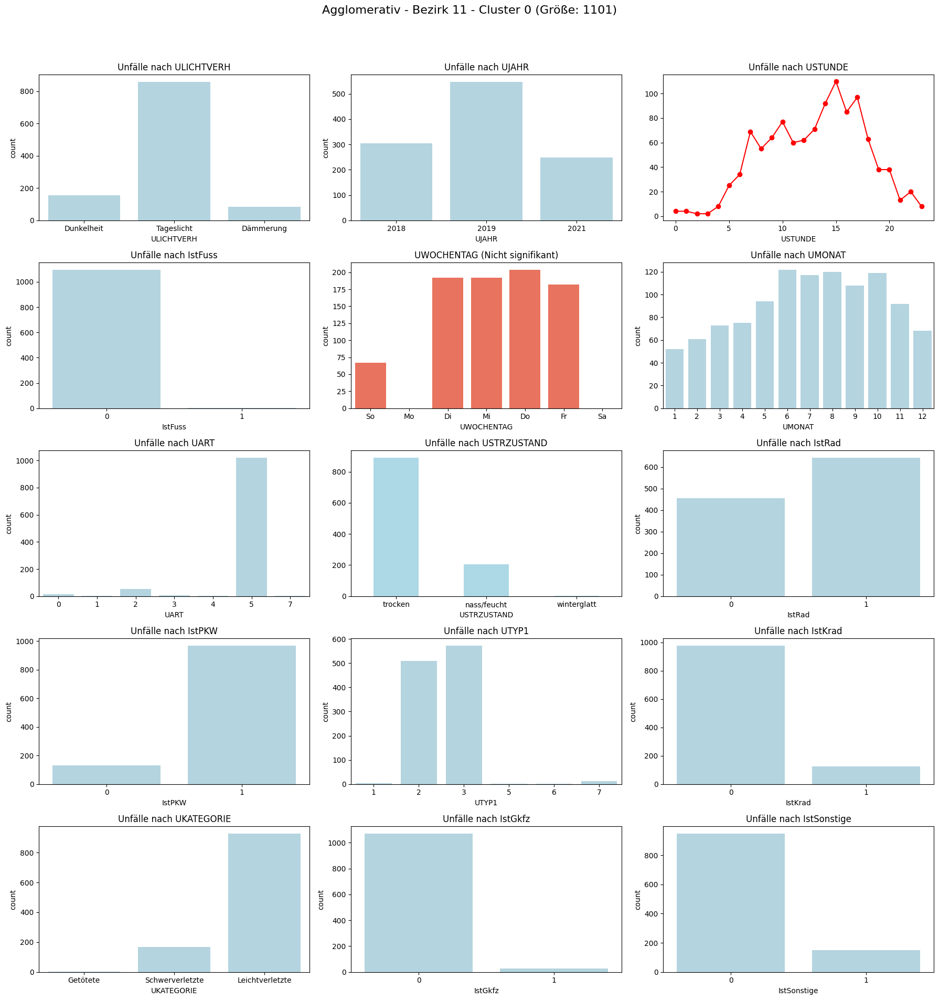

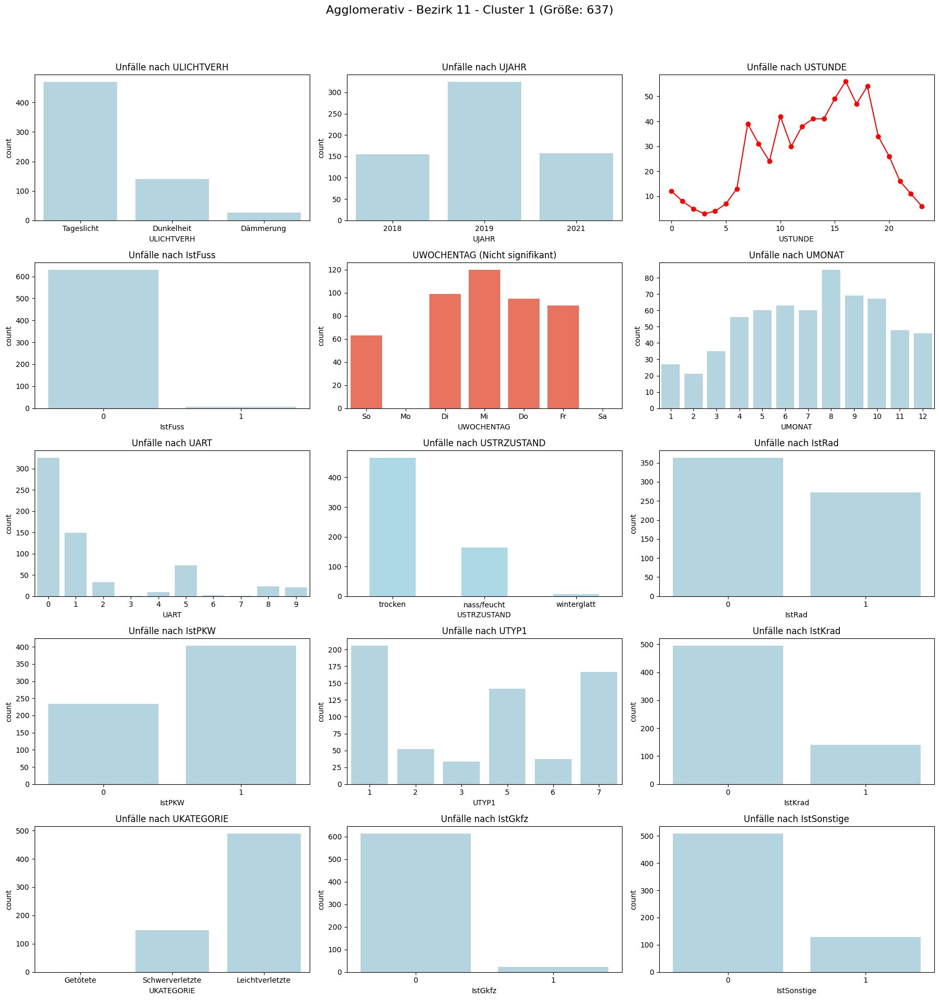

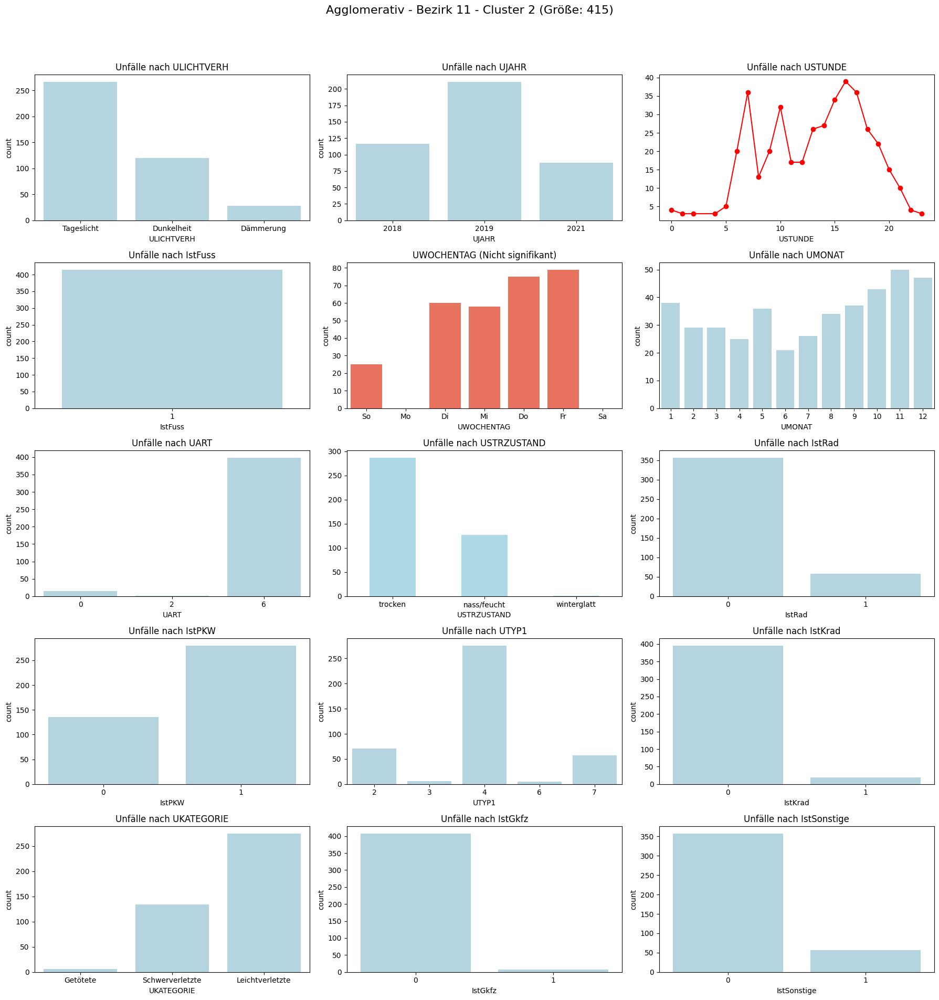

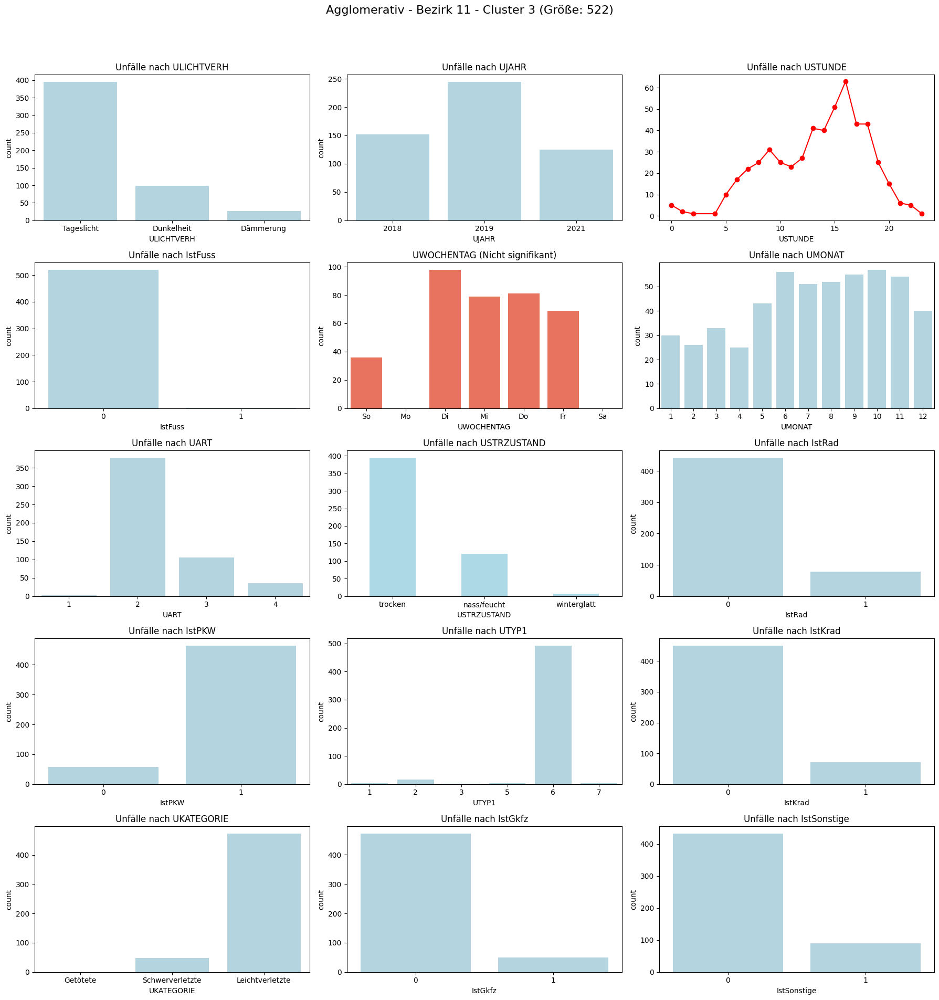

     UJAHR  UMONAT UWOCHENTAG  USTUNDE  USTRZUSTAND       UKATEGORIE  \
BEZ                                                                    
1     2019       9         Mi     13.8            0  Leichtverletzte   
2     2019       6         Di     13.7            0  Leichtverletzte   
3     2019       6         Mi     13.2            0  Leichtverletzte   
4     2019       9         Di     13.6            0  Leichtverletzte   
5     2019       8         Di     13.3            0  Leichtverletzte   
6     2019       6         Mi     13.5            0  Leichtverletzte   
7     2019       6         Di     13.6            0  Leichtverletzte   
8     2019       8         Mi     13.9            0  Leichtverletzte   
9     2019       6         Di     13.2            0  Leichtverletzte   
10    2019       6         Do     13.1            0  Leichtverletzte   
11    2019       8         Do     13.2            0  Leichtverletzte   
12    2019       8         Fr     13.5            0  Leichtverle

In [1]:
import pandas as pd  # Für die Arbeit mit tabellarischen Daten (Datenanalyse und -verarbeitung)
import matplotlib.pyplot as plt  # Für die Erstellung von Diagrammen und Visualisierungen
import seaborn as sns  # Erweiterung von matplotlib für schönere und einfachere Diagramme
import numpy as np  # Für numerische Berechnungen, Arrays und mathematische Funktionen
import joblib  # Zum Speichern und Laden von Modellen oder großen Datenstrukturen

# Daten laden
df_encoded = pd.read_csv("hierarchisch_final_clusters_pro_bezirk_mit_optimaler_anzahl.csv")
cluster_labels = np.load("hierarchisch_final_clusters_pro_bezirk.npy")

# Lade den Standard-Scaler und One-Hot-Encoder
minmax_scaler = joblib.load('min_max_scaler.pkl')
onehot_encoder = joblib.load('onehot_encoder.pkl')

# -----------------------------
# Variablen definieren
# -----------------------------
numerical_vars = ['UJAHR', 'UMONAT', 'USTUNDE', 'UWOCHENTAG']
ordinal_vars = ['UKATEGORIE']
nominal_vars = ['UART', 'UTYP1', 'ULICHTVERH', 'USTRZUSTAND']
binary_vars = ['IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz', 'IstSonstige']

# Kombinierte Liste für kategoriale Variablen (nominal + ordinal)
categorical_vars = nominal_vars + ordinal_vars

# -----------------------------
# Daten zurücktransformieren
# -----------------------------
# Skalierte numerische Daten in Originalskala zurücktransformieren
all_numerical_vars = numerical_vars + ordinal_vars  # Alle numerischen + ordinale
# Sicherstellen, dass nur die numerischen Variablen transformiert werden
df_encoded[all_numerical_vars] = minmax_scaler.inverse_transform(df_encoded[all_numerical_vars])

# One-Hot-Encoding rückgängig machen
onehot_columns = onehot_encoder.get_feature_names_out(nominal_vars)
df_nominal = pd.DataFrame(onehot_encoder.inverse_transform(df_encoded[onehot_columns]), columns=nominal_vars)

# Dummy-Spalten aus df_encoded entfernen und die zurücktransformierten Werte einfügen
df_encoded.drop(columns=onehot_columns, inplace=True)  # Entferne One-Hot-Encoded-Spalten
df_encoded = pd.concat([df_encoded, df_nominal], axis=1)  # Füge zurücktransformierte Werte hinzu

df_encoded['UJAHR'] = df_encoded['UJAHR'].astype(int)
df_encoded['UMONAT'] = df_encoded['UMONAT'].round(0).astype(int)

# Binäre Variablen definieren
binary_features = ['IstFuss', 'IstPKW', 'IstRad', 'IstGkfz', 'IstSonstige']

# Cluster-Labels hinzufügen
df_encoded['Cluster'] = cluster_labels

# Mapping für Lichtverhältnisse
licht_map = {0: "Tageslicht", 1: "Dämmerung", 2: "Dunkelheit"}
df_nominal['ULICHTVERH'] = df_nominal['ULICHTVERH'].map(licht_map)

# **Mapping-Tabellen für die Rücktransformation**
wochentag_map = {1: "So", 2: "Mo", 3: "Di", 4: "Mi", 5: "Do", 6: "Fr", 7: "Sa"}
ukategorie_map = {1: "Getötete", 2: "Schwerverletzte", 3: "Leichtverletzte"}

# **Anwenden der Mappings**
df_encoded['UWOCHENTAG'] = df_encoded['UWOCHENTAG'].map(wochentag_map)
df_encoded['UKATEGORIE'] = df_encoded['UKATEGORIE'].map(ukategorie_map)
df_encoded['ULICHTVERH'] = df_encoded['ULICHTVERH'].map(licht_map)

# Kategorische Reihenfolgen setzen
df_encoded['UWOCHENTAG'] = pd.Categorical(df_encoded['UWOCHENTAG'], 
                                          categories=["So", "Mo", "Di", "Mi", "Do", "Fr", "Sa"], ordered=True)

# Reihenfolge der Features für Visualisierung
desired_feature_order = [
    'ULICHTVERH', 'UJAHR', 'USTUNDE', 'IstFuss', 'UWOCHENTAG', 'UMONAT', 'UART', 
    'USTRZUSTAND', 'IstRad', 'IstPKW', 'UTYP1', 'IstKrad', 'UKATEGORIE', 'IstGkfz', 'IstSonstige'
]

# -----------------------------
# Dynamische Subplots für jedes Cluster erstellen
# -----------------------------
# Lade die Kruskal-Wallis-Ergebnisse aus der ersten Datei (beispielsweise als CSV)
kruskal_df = pd.read_csv("Kruskal-Wallis_results_agglo_per_bezirk.csv")

# Filter für signifikante Features (p-value < 0.05)
significant_features = kruskal_df[kruskal_df['p-value'] < 0.05]

# Sortiere nach H-statistic absteigend
significant_features_sorted = significant_features.sort_values(by='H-statistic', ascending=False)

# Festgelegte Reihenfolge der Variablen
desired_feature_order = [
    'ULICHTVERH', 'UJAHR', 'USTUNDE', 'IstFuss', 'UWOCHENTAG', 'UMONAT', 'UART', 
    'USTRZUSTAND', 'IstRad', 'IstPKW', 'UTYP1', 'IstKrad', 'UKATEGORIE', 'IstGkfz', 'IstSonstige']

significant_features_list = significant_features_sorted['Feature'].tolist()

# Verwende desired_feature_order nur für die Visualisierung
filtered_features = [feature for feature in desired_feature_order if feature in significant_features_list]

# Bestimme die nicht signifikanten Features basierend auf der gewünschten Reihenfolge und den signifikanten Features
non_significant_features = [feature for feature in desired_feature_order if feature not in filtered_features]

# **Visualisierung nach Bezirk & Cluster**
bezirke = df_encoded['BEZ'].unique()  # Falls du 'BEZ' als Bezirk benötigst

for bezirk in bezirke:
    df_bezirk = df_encoded[df_encoded['BEZ'] == bezirk].copy()

    if df_bezirk.empty:
        continue
    
    # Cluster im aktuellen Bezirk
    bezirk_cluster_counts = df_bezirk['Cluster'].value_counts().sort_index()
    valid_clusters = bezirk_cluster_counts[(bezirk_cluster_counts.index != -1) & (bezirk_cluster_counts > 1)].index

    for cluster_id in valid_clusters:
        df_cluster = df_bezirk[df_bezirk['Cluster'] == cluster_id]

        # Formatierungen
        df_cluster.loc[:, 'UJAHR'] = df_cluster['UJAHR'].astype(int)
        df_cluster.loc[:, 'UMONAT'] = df_cluster['UMONAT'].round(0).astype(int)

        # **Visualisierung pro Cluster**
        plots = []

        for feature in desired_feature_order:
            if feature in df_cluster.columns and not df_cluster[feature].isna().all():
                # Hier überprüfen, ob das Feature nicht signifikant ist
                is_non_significant = feature in non_significant_features

                # Wenn das Feature nicht signifikant ist, markiere es entsprechend
                if is_non_significant:
                    # Verwende z.B. eine spezielle Farbe für nicht signifikante Features
                    plots.append((feature, '#FF6347', f'{feature} (Nicht signifikant)'))  # Farbe Tomatenrot für nicht signifikant
                else:
                    # Normale Farbe für signifikante Features
                    plots.append((feature, '#ADD8E6', f'Unfälle nach {feature}'))

        n_plots = len(plots)
        n_cols = 3
        n_rows = int(np.ceil(n_plots / n_cols))

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows))
        axes = axes.flatten()

        fig.suptitle(f'Agglomerativ - Bezirk {bezirk} - Cluster {cluster_id} (Größe: {len(df_cluster)})', fontsize=16)

        for i, (feature, color, title) in enumerate(plots):
            ax = axes[i]

            # **Spezielle Visualisierungen für bestimmte Features**
            if feature == 'USTUNDE':
                df_cluster['USTUNDE'].value_counts().sort_index().plot(
                    kind='line', ax=ax, color='red', marker='o'
                )
            elif feature == 'USTRZUSTAND':
                ustrzustand_counts = df_cluster['USTRZUSTAND'].value_counts().sort_index()
                ustrzustand_counts = ustrzustand_counts.reindex([0, 1, 2], fill_value=0)
                ustrzustand_counts.plot(kind='bar', ax=ax, color=color)
                ax.set_xticks([0, 1, 2])
                ax.set_xticklabels(['trocken', 'nass/feucht', 'winterglatt'], rotation=0)
            elif feature == 'UWOCHENTAG':
                sns.countplot(x=feature, data=df_cluster, ax=ax, hue=feature, palette=[color]*7, order=["So", "Mo", "Di", "Mi", "Do", "Fr", "Sa"], dodge=False, legend=False)
            elif feature == 'UKATEGORIE':
                sns.countplot(x=feature, data=df_cluster, ax=ax, hue=feature, palette=[color]*len(df_cluster['UKATEGORIE'].unique()), order=["Getötete", "Schwerverletzte", "Leichtverletzte"], legend=False)
            else:
                sns.countplot(x=feature, data=df_cluster, ax=ax, color=color, legend=False)

            ax.set_title(title)

        # Leere Achsen entfernen
        for j in range(n_plots, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.savefig(f"output/plots/Agglomerativ - Bezirk_{bezirk}_Cluster_{cluster_id}.png", dpi=100, bbox_inches="tight")
        plt.show()

       # print(f"Agglomerativ - Bezirk {bezirk}, Cluster {cluster_id} - {len(df_cluster)} Datenpunkte visualisiert.")

#-----------------------------------------------------
### Tabelarische Form der ANalyse###############
# ------------------------------------------------------

# Relevante Variablen für die Zusammenfassung
# Relevante Variablen für die Zusammenfassung
# Relevante Variablen für die Zusammenfassung
summary_vars = {
    'UJAHR': 'mean',          # Durchschnittliches Unfalljahr
    'UMONAT': lambda x: x.mode()[0],  # Häufigster Monat
    'UWOCHENTAG': lambda x: x.mode()[0],  # Häufigster Wochentag
    'USTUNDE': 'mean',        # Durchschnittliche Unfallzeit
    'USTRZUSTAND': lambda x: x.mode()[0],  # Häufigster Straßenzustand
    'UKATEGORIE': lambda x: x.mode()[0],   # Häufigste Unfallkategorie
    'ULICHTVERH': lambda x: x.mode()[0],   # Häufigste Lichtverhältnisse
    'UART': lambda x: x.mode()[0],         # Häufigste Unfallart
    'UTYP1': lambda x: x.mode()[0],       # Häufigster Unfalltyp
    'IstRad': 'mean',
    'IstPKW': 'mean',
    'IstFuss': 'mean',
    'IstKrad': 'mean',
    'IstGkfz': 'mean',
    'IstSonstige': 'mean'
}

# Gruppierung nach BEZ (Bezirk) und Berechnung der Werte
cluster_summary = df_encoded.groupby('BEZ').agg(summary_vars)

# Werte runden
cluster_summary['UJAHR'] = cluster_summary['UJAHR'].round().astype(int)
cluster_summary['UMONAT'] = cluster_summary['UMONAT'].astype(int)
cluster_summary['USTUNDE'] = cluster_summary['USTUNDE'].round(1)
for col in ['IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz', 'IstSonstige']:
    cluster_summary[col] = cluster_summary[col].round(1)

# Anzahl der Datenpunkte pro Bezirk hinzufügen
cluster_summary['Anzahl_Unfälle'] = df_encoded['BEZ'].value_counts().sort_index()

# Ergebnisse ausgeben
print(cluster_summary)

# Optional: Als CSV speichern
cluster_summary.to_csv("Agglomerativ_Cluster_Summary_Pro_Bezirk.csv")

#---------------------------------------------------------------
# Gruppierung nach BEZ (Bezirk) und Cluster und Berechnung der Werte
cluster_summary = df_encoded.groupby(['BEZ', 'Cluster']).agg(summary_vars)

# Werte runden
cluster_summary['UJAHR'] = cluster_summary['UJAHR'].round().astype(int)
cluster_summary['UMONAT'] = cluster_summary['UMONAT'].astype(int)
cluster_summary['USTUNDE'] = cluster_summary['USTUNDE'].round(1)
for col in ['IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz', 'IstSonstige']:
    cluster_summary[col] = cluster_summary[col].round(1)

# Anzahl der Datenpunkte pro Bezirk und Cluster hinzufügen
cluster_summary['Anzahl_Unfälle'] = df_encoded.groupby(['BEZ', 'Cluster']).size()

# Ergebnisse ausgeben
print(cluster_summary)

# Optional: Als CSV speichern
cluster_summary.to_csv("Agglomerativ_Cluster_Summary_Pro_Bezirk_Pro_Cluster.csv")

